# Base de Dados e Treinamento da Rede YOLO

Instalações necessárias

In [1]:
!pip install torch torchvision opencv-python

In [2]:
!wget https://pjreddie.com/media/files/yolov3.weights
!wget https://pjreddie.com/media/files/coco.names
!wget https://raw.githubusercontent.com/pjreddie/darknet/master/cfg/yolov3.cfg
!wget https://raw.githubusercontent.com/pjreddie/darknet/master/data/coco.names

--2024-12-31 17:33:55--  https://pjreddie.com/media/files/yolov3.weights
Resolving pjreddie.com (pjreddie.com)... 162.0.215.52
Connecting to pjreddie.com (pjreddie.com)|162.0.215.52|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 248007048 (237M) [application/octet-stream]
Saving to: ‘yolov3.weights’

yolov3.weights      100%[===================>] 236.52M  39.1MB/s    in 6.4s    

2024-12-31 17:34:02 (37.0 MB/s) - ‘yolov3.weights’ saved [248007048/248007048]

--2024-12-31 17:34:02--  https://pjreddie.com/media/files/coco.names
Resolving pjreddie.com (pjreddie.com)... 162.0.215.52
Connecting to pjreddie.com (pjreddie.com)|162.0.215.52|:443... connected.
HTTP request sent, awaiting response... 404 Not Found
2024-12-31 17:34:02 ERROR 404: Not Found.

--2024-12-31 17:34:02--  https://raw.githubusercontent.com/pjreddie/darknet/master/cfg/yolov3.cfg
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.108.133, 185.199.109.133, 185.199.110.133, 

Carregando a rede YOLO e nomes de classes COCO

In [9]:
net = cv2.dnn.readNet("yolov3.weights", "yolov3.cfg")
layer_names = net.getLayerNames()
output_layers = [layer_names[i - 1] for i in net.getUnconnectedOutLayers()]

with open("coco.names", "r") as f:
  classes = [line.strip() for line in f.readlines()]

Importação de imagens para detecção de objetos em cena

Saving image004.jpg to image004.jpg
Saving image001.jpg to image001.jpg
Saving image002.jpg to image002.jpg
Saving image003.jpg to image003.jpg


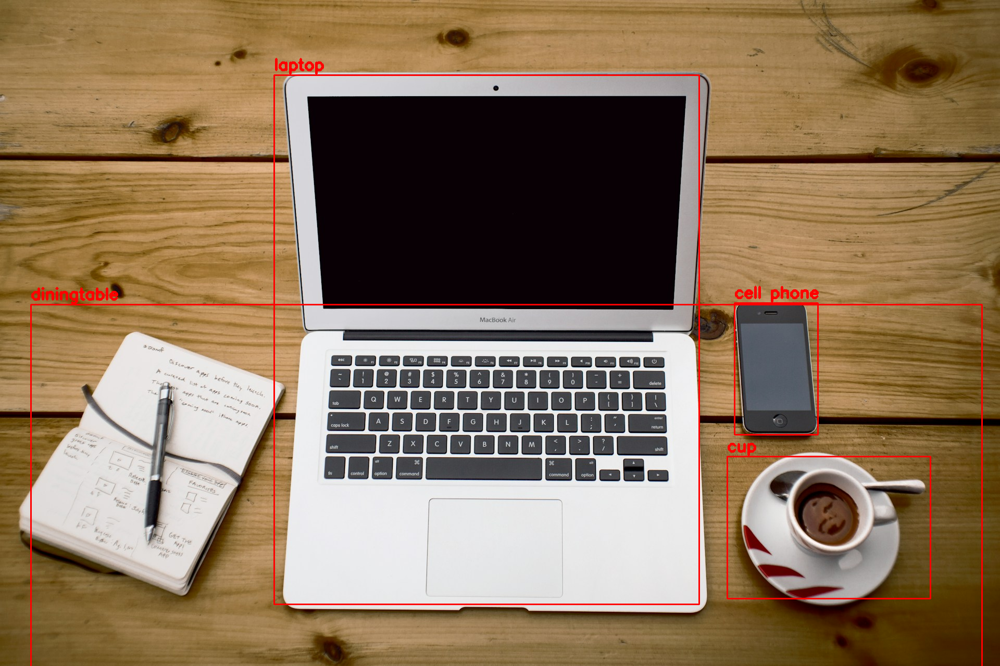

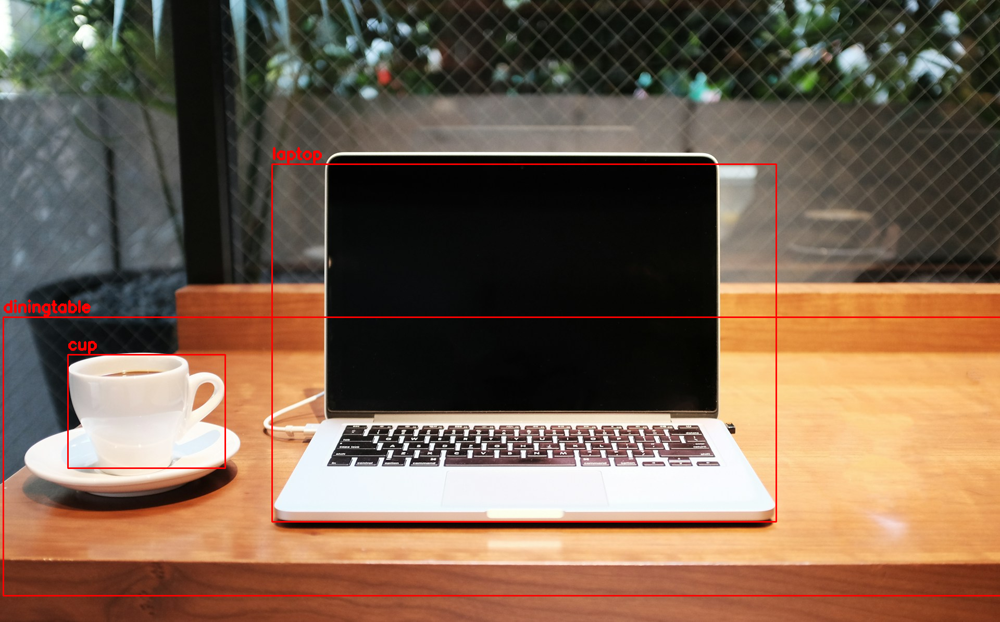

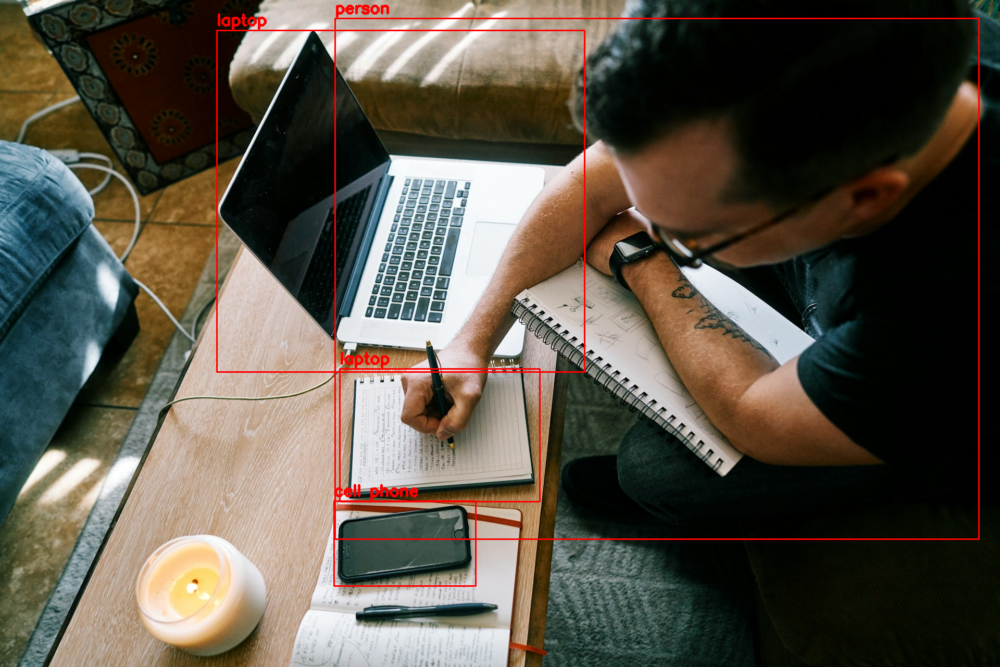

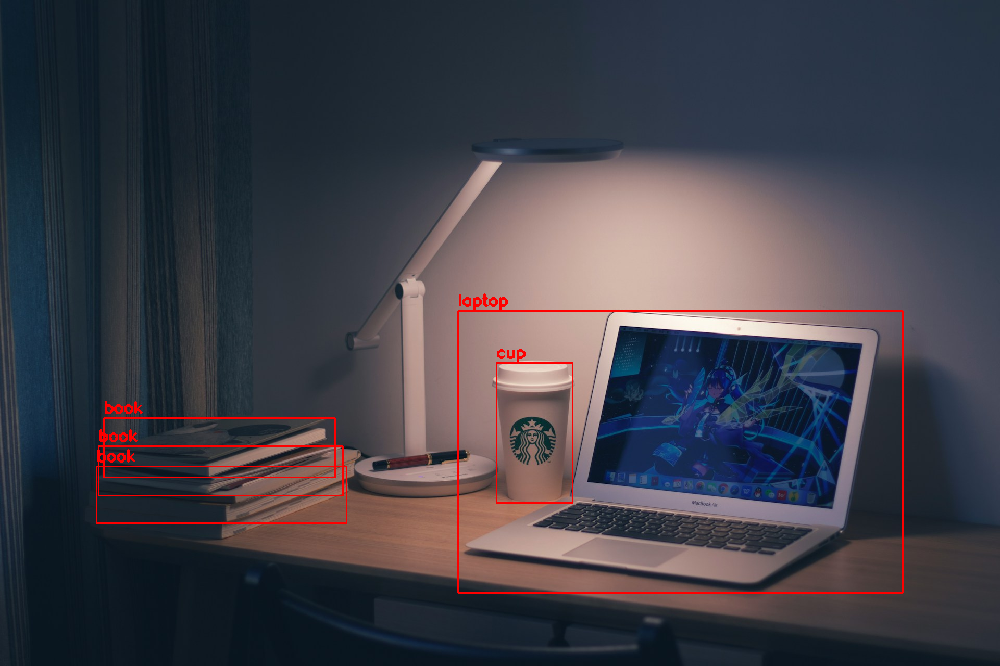

In [8]:
from google.colab import files
import cv2
import numpy as np
from google.colab.patches import cv2_imshow

# Fazer upload das imagens
uploaded = files.upload()

# Iterar sobre os arquivos carregados
for file_name in uploaded.keys():
    # Carregar a imagem
    image = cv2.imread(file_name)
    height, width, channels = image.shape

    # Preparar a imagem para a rede
    blob = cv2.dnn.blobFromImage(image, 0.00392, (416, 416), (0, 0, 0), True, crop=False)
    net.setInput(blob)
    outs = net.forward(output_layers)

    # Analisar as detecções
    class_ids = []
    confidences = []
    boxes = []
    for out in outs:
        for detection in out:
            scores = detection[5:]
            class_id = np.argmax(scores)
            confidence = scores[class_id]
            if confidence > 0.5:
                center_x = int(detection[0] * width)
                center_y = int(detection[1] * height)
                w = int(detection[2] * width)
                h = int(detection[3] * height)
                x = int(center_x - w / 2)
                y = int(center_y - h / 2)
                boxes.append([x, y, w, h])
                confidences.append(float(confidence))
                class_ids.append(class_id)

    # Aplicar Non-Maximum Suppression
    indexes = cv2.dnn.NMSBoxes(boxes, confidences, 0.5, 0.4)

    # Desenhar as caixas delimitadoras
    for i in range(len(boxes)):
        if i in indexes:
            x, y, w, h = boxes[i]
            label = str(classes[class_ids[i]])
            color = (0, 0, 255)
            cv2.rectangle(image, (x, y), (x + w, y + h), color, 2)
            cv2.putText(image, label, (x, y - 10), cv2.FONT_HERSHEY_SIMPLEX, 1, color, 3)

    # Exibir a imagem
    cv2_imshow(image)

cv2.waitKey(0)
cv2.destroyAllWindows()